In [7]:
import intake
import xarray as xr 
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from calendar import monthrange
import numpy as np
import cartopy
from tqdm import tqdm
from scipy import interpolate
import pandas as pd
import seaborn as sns
import os
from scipy import stats

#%config InlineBackend.figure_format='retina'

from matplotlib import gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

In [2]:
historical_year_start = 2000
historical_year_end = 2014

future_year_start = 2086
future_year_end = 2100

In [3]:
parent_dir = '/home/jovyan/PlanetaryComputerExamples/Paper3/Paper3/Manuscript_final/'

In [4]:
save_folder = 'SA_emp_vs_future_'+str(future_year_start)+'_'+str(future_year_end)+'/'

In [5]:
keys = ['ssp126.ACCESS-CM2', 'ssp126.ACCESS-ESM1-5', 'ssp126.AWI-CM-1-1-MR', 'ssp126.BCC-CSM2-MR', 'ssp126.CAS-ESM2-0', 'ssp126.CESM2-WACCM', 'ssp126.CMCC-CM2-SR5', 'ssp126.CMCC-ESM2', 'ssp126.CanESM5', 'ssp126.EC-Earth3', 'ssp126.EC-Earth3-Veg-LR', 'ssp126.FGOALS-f3-L', 'ssp126.FGOALS-g3', 'ssp126.FIO-ESM-2-0', 'ssp126.GFDL-ESM4', 'ssp126.INM-CM4-8', 'ssp126.INM-CM5-0', 'ssp126.IPSL-CM6A-LR', 'ssp126.KACE-1-0-G', 'ssp126.MIROC6', 'ssp126.MPI-ESM1-2-HR', 'ssp126.MPI-ESM1-2-LR', 'ssp126.MRI-ESM2-0', 'ssp126.NESM3', 'ssp126.NorESM2-LM', 'ssp126.NorESM2-MM', 'ssp126.TaiESM1', 'ssp245.ACCESS-CM2', 'ssp245.AWI-CM-1-1-MR', 'ssp245.BCC-CSM2-MR', 'ssp245.CAS-ESM2-0', 'ssp245.CESM2-WACCM', 'ssp245.CMCC-CM2-SR5', 'ssp245.CMCC-ESM2', 'ssp245.CanESM5', 'ssp245.EC-Earth3', 'ssp245.EC-Earth3-CC', 'ssp245.EC-Earth3-Veg-LR', 'ssp245.FGOALS-f3-L', 'ssp245.FGOALS-g3', 'ssp245.FIO-ESM-2-0', 'ssp245.GFDL-CM4', 'ssp245.GFDL-ESM4', 'ssp245.IITM-ESM', 'ssp245.INM-CM4-8', 'ssp245.INM-CM5-0', 'ssp245.IPSL-CM6A-LR', 'ssp245.KACE-1-0-G', 'ssp245.MIROC6', 'ssp245.MPI-ESM1-2-HR', 'ssp245.MPI-ESM1-2-LR', 'ssp245.MRI-ESM2-0', 'ssp245.NESM3', 'ssp245.NorESM2-LM', 'ssp245.NorESM2-MM', 'ssp245.TaiESM1', 'ssp370.ACCESS-CM2', 'ssp370.AWI-CM-1-1-MR', 'ssp370.BCC-CSM2-MR', 'ssp370.CAS-ESM2-0', 'ssp370.CESM2-WACCM', 'ssp370.CMCC-CM2-SR5', 'ssp370.CMCC-ESM2', 'ssp370.CanESM5', 'ssp370.EC-Earth3', 'ssp370.EC-Earth3-AerChem', 'ssp370.EC-Earth3-Veg-LR', 'ssp370.FGOALS-f3-L', 'ssp370.FGOALS-g3', 'ssp370.GFDL-ESM4', 'ssp370.IITM-ESM', 'ssp370.INM-CM4-8', 'ssp370.INM-CM5-0', 'ssp370.IPSL-CM5A2-INCA', 'ssp370.IPSL-CM6A-LR', 'ssp370.KACE-1-0-G', 'ssp370.MIROC6', 'ssp370.MPI-ESM1-2-HR', 'ssp370.MPI-ESM1-2-LR', 'ssp370.MRI-ESM2-0', 'ssp370.NorESM2-LM', 'ssp370.NorESM2-MM', 'ssp370.TaiESM1', 'ssp585.ACCESS-CM2', 'ssp585.ACCESS-ESM1-5', 'ssp585.AWI-CM-1-1-MR', 'ssp585.BCC-CSM2-MR', 'ssp585.CAS-ESM2-0', 'ssp585.CESM2-WACCM', 'ssp585.CMCC-CM2-SR5', 'ssp585.CMCC-ESM2', 'ssp585.CanESM5', 'ssp585.E3SM-1-1', 'ssp585.EC-Earth3', 'ssp585.EC-Earth3-CC', 'ssp585.EC-Earth3-Veg-LR', 'ssp585.FGOALS-f3-L', 'ssp585.FGOALS-g3', 'ssp585.FIO-ESM-2-0', 'ssp585.GFDL-CM4', 'ssp585.GFDL-ESM4', 'ssp585.IITM-ESM', 'ssp585.INM-CM4-8', 'ssp585.INM-CM5-0', 'ssp585.IPSL-CM6A-LR', 'ssp585.KACE-1-0-G', 'ssp585.MIROC6', 'ssp585.MPI-ESM1-2-HR', 'ssp585.MPI-ESM1-2-LR', 'ssp585.MRI-ESM2-0', 'ssp585.NESM3', 'ssp585.NorESM2-MM', 'ssp585.TaiESM1']

In [8]:
SA_CMIP6_class_all_forest_savanna_corrected = {}
for name in tqdm(keys):
    SA_CMIP6_class_all_forest_savanna_corrected[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Normal.nc').Variable

100%|██████████| 113/113 [00:02<00:00, 55.93it/s] 


In [9]:
save_folder = 'AF_emp_vs_future_'+str(future_year_start)+'_'+str(future_year_end)+'/'

In [10]:
AF_CMIP6_class_all_forest_savanna_corrected = {}
for name in tqdm(keys):
    AF_CMIP6_class_all_forest_savanna_corrected[name] = xr.open_dataset(parent_dir+'/Saved_NetCDF/'+save_folder+name+'-Normal.nc').Variable

100%|██████████| 113/113 [00:00<00:00, 118.31it/s]


Sensitivity-Normal (ssp585)
Sensitivity-Normal (ssp370)


/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1486: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1487: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1486: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1487: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


Sensitivity-Normal (ssp245)
Sensitivity-Normal (ssp126)


/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1486: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1487: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1486: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1487: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1486: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1487: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z

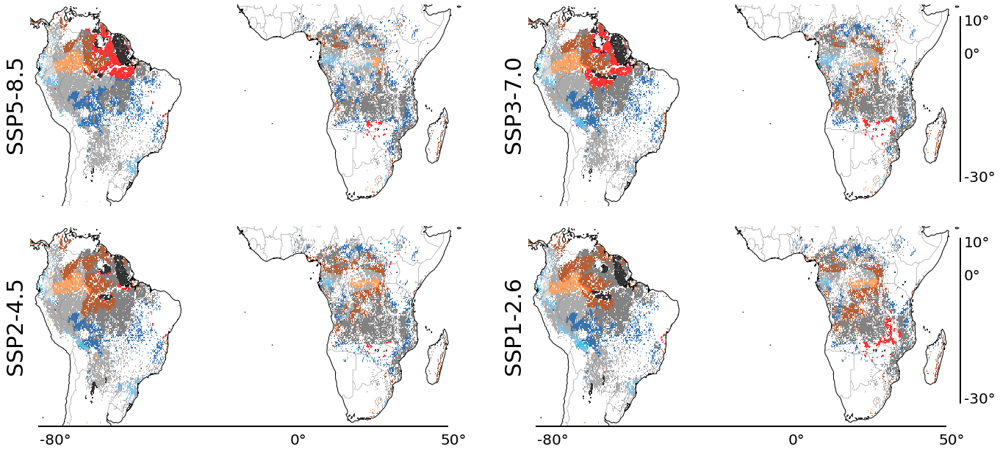

In [134]:
fig = plt.figure(figsize=(22,10))
ax = [plt.subplot(221,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(222,projection=ccrs.PlateCarree(), aspect='auto'), 
      plt.subplot(223,projection=ccrs.PlateCarree(), aspect='auto'), plt.subplot(224,projection=ccrs.PlateCarree(), aspect='auto')]

alpha = 0.8
model_name = 'ACCESS-CM2'
i = 0
for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
    print('Sensitivity-Normal ('+SSP+')');
    ax[i].text(-87.5, -22, SSP_name, ha='center', fontsize = 30, color = 'black', zorder = 1000, rotation  = 90);
    a = SA_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+model_name]
    a.where(a <=3).plot(colors = ['#CCCCCC','#FD8D3C','#FA5300'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 0.9, vmax= 3.1, alpha = alpha)
    a.where((a >= 4) & (a <= 6)).plot(colors = ['#6BAED6','#969696','#A63603'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 3.9, vmax= 6.1, alpha = alpha)
    a.where((a >=7) & (a <= 9)).plot(colors = ['#00B0F0','#08519C','#636363'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 6.9, vmax= 9.1, alpha = alpha)
    a.where(a == 11).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 12).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 13).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 991).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 992).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 993).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
    i = i+1

i = 0
for SSP in ['ssp585','ssp370','ssp245','ssp126']:
    a = AF_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+model_name]
    a.where(a <=3).plot(colors = ['#CCCCCC','#FD8D3C','#FA5300'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 0.9, vmax= 3.1, alpha = alpha)
    a.where((a >= 4) & (a <= 6)).plot(colors = ['#6BAED6','#969696','#A63603'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 3.9, vmax= 6.1, alpha = alpha)
    a.where((a >=7) & (a <= 9)).plot(colors = ['#00B0F0','#08519C','#636363'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 6.9, vmax= 9.1, alpha = alpha)
    a.where(a == 11).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 12).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 13).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 991).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 992).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
    a.where(a == 993).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
    i = i+1
    
for j in range(4):
    ax[j].coastlines(lw = 1)
    ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5, color = 'grey')
    fig.patch.set_visible(False)
    ax[j].axis('off')
    ax[j].set_xlim(-83,55.2)
    ax[j].set_ylim(-36,13)
    
for i in [1,3]:
    ax[i].plot([55,55],[10,-30], color = 'black', lw = 2)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(56, 0,'0°', fontsize = '20')
    ax[i].text(56, 8,'10°', fontsize = '20')
    ax[i].text(56, -30,'-30°', fontsize = '20')

for i in [2,3]:
    ax[i].plot([-80,50],[-36,-36], color = 'black', lw = 4)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
    ax[i].tick_params(axis='x',          # changes apply to the x-axis
                    which='both',      # both major and minor ticks are affected
                    bottom=False,      # ticks along the bottom edge are off
                    top=False,         # ticks along the top edge are off
                    labelbottom=False)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    ax[i].text(-80,-40,'-80°', fontsize = '20')
    ax[i].text(0,-40,'0°', fontsize = '20')
    ax[i].text(48,-40,'50°', fontsize = '20')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.15, hspace=0.1)

fig.savefig(parent_dir+'/Figures/Supplementary_Fig7_ACCESS-CM2.tif', dpi=300, bbox_inches="tight")

In [15]:
model_name = 'ACCESS-CM2'

def supplementary_data(model_name):
    i = 0
    for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
        print('Sensitivity-Normal ('+SSP+')');
        ax[i].text(-87.5, -22, SSP_name, ha='center', fontsize = 30, color = 'black', zorder = 1000, rotation  = 90);
        a = SA_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+model_name]
        a.where(a <=3).plot(colors = ['#CCCCCC','#FD8D3C','#FA5300'], add_colorbar=False, ax=ax[i][], levels = 4, vmin = 0.9, vmax= 3.1, alpha = alpha)
        a.where((a >= 4) & (a <= 6)).plot(colors = ['#6BAED6','#969696','#A63603'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 3.9, vmax= 6.1, alpha = alpha)
        a.where((a >=7) & (a <= 9)).plot(colors = ['#00B0F0','#08519C','#636363'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 6.9, vmax= 9.1, alpha = alpha)
        a.where(a == 11).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
        a.where(a == 12).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
        a.where(a == 13).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
        a.where(a == 991).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
        a.where(a == 992).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
        a.where(a == 993).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
        i = i+1

    i = 0
    for SSP in ['ssp585','ssp370','ssp245','ssp126']:
        a = AF_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+model_name]
        a.where(a <=3).plot(colors = ['#CCCCCC','#FD8D3C','#FA5300'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 0.9, vmax= 3.1, alpha = alpha)
        a.where((a >= 4) & (a <= 6)).plot(colors = ['#6BAED6','#969696','#A63603'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 3.9, vmax= 6.1, alpha = alpha)
        a.where((a >=7) & (a <= 9)).plot(colors = ['#00B0F0','#08519C','#636363'], add_colorbar=False, ax=ax[i], levels = 4, vmin = 6.9, vmax= 9.1, alpha = alpha)
        a.where(a == 11).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
        a.where(a == 12).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
        a.where(a == 13).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i], alpha = alpha)
        a.where(a == 991).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
        a.where(a == 992).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
        a.where(a == 993).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i], alpha = alpha)
        i = i+1
"""
    for j in range(4):
        ax[j].coastlines(lw = 1)
        ax[j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5, color = 'grey')
        fig.patch.set_visible(False)
        ax[j].axis('off')
        ax[j].set_xlim(-83,55.2)
        ax[j].set_ylim(-36,13)

    for i in [1,3]:
        ax[i].plot([55,55],[10,-30], color = 'black', lw = 2)
        ax[i].spines['right'].set_visible(False)
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['bottom'].set_visible(False)
        ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
        ax[i].tick_params(axis='x',          # changes apply to the x-axis
                        which='both',      # both major and minor ticks are affected
                        bottom=False,      # ticks along the bottom edge are off
                        top=False,         # ticks along the top edge are off
                        labelbottom=False)
        ax[i].tick_params(axis='both', which='major', labelsize=15)
        ax[i].text(56, 0,'0°', fontsize = '20')
        ax[i].text(56, 8,'10°', fontsize = '20')
        ax[i].text(56, -30,'-30°', fontsize = '20')

    for i in [2,3]:
        ax[i].plot([-80,50],[-36,-36], color = 'black', lw = 4)
        ax[i].spines['right'].set_visible(False)
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['bottom'].set_visible(False)
        ax[i].set_ylabel(r'Area (km$^{2}$) x 10$^{6}$',fontsize = 15)
        ax[i].tick_params(axis='x',          # changes apply to the x-axis
                        which='both',      # both major and minor ticks are affected
                        bottom=False,      # ticks along the bottom edge are off
                        top=False,         # ticks along the top edge are off
                        labelbottom=False)
        ax[i].tick_params(axis='both', which='major', labelsize=15)
        ax[i].text(-80,-40,'-80°', fontsize = '20')
        ax[i].text(0,-40,'0°', fontsize = '20')
        ax[i].text(48,-40,'50°', fontsize = '20')
"""

In [138]:
for pdf in np.arange(5,35,5):
    fig, ax = plt.subplots(5,4, figsize=(50,20), subplot_kw={'projection': ccrs.PlateCarree()}, dpi = 300)
    
    i = 0
    for model_name in df_final['source_id'].iloc[pdf:pdf+5]:
        j = 0
        for SSP, SSP_name in zip(['ssp585','ssp370','ssp245','ssp126'],['SSP5-8.5','SSP3-7.0','SSP2-4.5','SSP1-2.6']):
            #print('Sensitivity-Normal ('+SSP+')');
            if i == 0:
                ax[i,j].text(-50, 18, SSP_name, va='center', fontsize = 40, color = 'black', zorder = 1000);
            if j == 0:
                ax[i,j].text(-87.5, -25, model_name, ha='center', fontsize = 25, color = 'black', zorder = 1000, rotation = 90);
            if SSP+'.'+model_name in SA_CMIP6_class_all_forest_savanna_corrected:
                a = SA_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+model_name]
                a.where(a <=3).plot(colors = ['#CCCCCC','#FD8D3C','#FA5300'], add_colorbar=False, ax=ax[i,j], levels = 4, vmin = 0.9, vmax= 3.1, alpha = alpha)
                a.where((a >= 4) & (a <= 6)).plot(colors = ['#6BAED6','#969696','#A63603'], add_colorbar=False, ax=ax[i,j], levels = 4, vmin = 3.9, vmax= 6.1, alpha = alpha)
                a.where((a >=7) & (a <= 9)).plot(colors = ['#00B0F0','#08519C','#636363'], add_colorbar=False, ax=ax[i,j], levels = 4, vmin = 6.9, vmax= 9.1, alpha = alpha)
                a.where(a == 11).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i,j], alpha = alpha)
                a.where(a == 12).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i,j], alpha = alpha)
                a.where(a == 13).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i,j], alpha = alpha)
                a.where(a == 991).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i,j], alpha = alpha)
                a.where(a == 992).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i,j], alpha = alpha)
                a.where(a == 993).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i,j], alpha = alpha)
                j = j+1
            else:
                #print("Key does not exist")
                j = j+1
                continue
        i = i+1
    
    i = 0
    for model_name in df_final['source_id'].iloc[pdf:pdf+5]:
        j = 0
        for SSP in ['ssp585','ssp370','ssp245','ssp126']:
            if SSP+'.'+model_name in AF_CMIP6_class_all_forest_savanna_corrected:
                a = AF_CMIP6_class_all_forest_savanna_corrected[SSP+'.'+model_name]
                a.where(a <=3).plot(colors = ['#CCCCCC','#FD8D3C','#FA5300'], add_colorbar=False, ax=ax[i,j], levels = 4, vmin = 0.9, vmax= 3.1, alpha = alpha)
                a.where((a >= 4) & (a <= 6)).plot(colors = ['#6BAED6','#969696','#A63603'], add_colorbar=False, ax=ax[i,j], levels = 4, vmin = 3.9, vmax= 6.1, alpha = alpha)
                a.where((a >=7) & (a <= 9)).plot(colors = ['#00B0F0','#08519C','#636363'], add_colorbar=False, ax=ax[i,j], levels = 4, vmin = 6.9, vmax= 9.1, alpha = alpha)
                a.where(a == 11).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i,j], alpha = alpha)
                a.where(a == 12).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i,j], alpha = alpha)
                a.where(a == 13).plot.contourf(colors = ['#ff0000'], add_colorbar=False, ax=ax[i,j], alpha = alpha)
                a.where(a == 991).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i,j], alpha = alpha)
                a.where(a == 992).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i,j], alpha = alpha)
                a.where(a == 993).plot.contourf(colors = ['black'], add_colorbar=False, ax=ax[i,j], alpha = alpha)
                j = j+1
            else:
                #print("Key does not exist")
                j = j+1
                continue
        i = i+1


    for i in range(5):
        for j in range(4):
            ax[i,j].coastlines(lw = 0.5)
            #ax[i,j].add_feature(cartopy.feature.BORDERS, linestyle='-', lw = 0.5, color = 'grey')
            fig.patch.set_visible(False)
            ax[i,j].axis('off')
            ax[i,j].set_xlim(-83,55.2)
            ax[i,j].set_ylim(-36,13) 
    plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.15, hspace=0.1)
    #plt.tight_layout()
    fig.savefig(parent_dir+'/Figures/Supplementary_data_'+str(pdf)+'.tif', dpi = 50)

/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1486: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1487: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1486: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1487: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1486: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/contour.py:1487: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z